## Context
Online retail is a transnational data set which contains all the transactions occurring between 01/12/2010 and 09/12/2011 for a UK-based and registered non-store online retail. The company mainly sells unique all-occasion gifts. Many customers of the company are wholesalers.

## Business Goal
We will be using the online retail trasnational dataset to build a RFM clustering and choose the best set of customers which the company should target.

In [80]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.cluster import KMeans

In [15]:
for dirname, _, filenames in os.walk('/Users/soumy'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/Users/soumy\.condarc
/Users/soumy\car.data
/Users/soumy\headbrain.csv
/Users/soumy\K MEANS CLUSTERING (MALL CUSTOMERS DATASET).ipynb
/Users/soumy\K-MEANS AND HEIRARCHICAL CLUSTERING ONLINE RETAIL DATASET.ipynb
/Users/soumy\KNN CLUSTERING- CAR SAFETY.ipynb
/Users/soumy\LINEAR REGRESSION 2.ipynb
/Users/soumy\LINEAR REGRESSION 3 HEADBRAIN.ipynb
/Users/soumy\LINEAR REGRESSION MODEL 1.ipynb
/Users/soumy\Mall_Customers.csv
/Users/soumy\NTUSER.DAT
/Users/soumy\ntuser.dat.LOG1
/Users/soumy\ntuser.dat.LOG2
/Users/soumy\NTUSER.DAT{53b39e87-18c4-11ea-a811-000d3aa4692b}.TxR.0.regtrans-ms
/Users/soumy\NTUSER.DAT{53b39e87-18c4-11ea-a811-000d3aa4692b}.TxR.1.regtrans-ms
/Users/soumy\NTUSER.DAT{53b39e87-18c4-11ea-a811-000d3aa4692b}.TxR.2.regtrans-ms
/Users/soumy\NTUSER.DAT{53b39e87-18c4-11ea-a811-000d3aa4692b}.TxR.blf
/Users/soumy\NTUSER.DAT{53b39e88-18c4-11ea-a811-000d3aa4692b}.TM.blf
/Users/soumy\NTUSER.DAT{53b39e88-18c4-11ea-a811-000d3aa4692b}.TMContainer00000000000000000001.regtrans-ms
/Users/soum

In [22]:
df = pd.read_csv('/Users/soumy/OnlineRetail.csv',engine='python')

In [23]:
df.shape

(541909, 8)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [25]:
df.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [26]:
df['Country'].value_counts()

United Kingdom          495478
Germany                   9495
France                    8557
EIRE                      8196
Spain                     2533
Netherlands               2371
Belgium                   2069
Switzerland               2002
Portugal                  1519
Australia                 1259
Norway                    1086
Italy                      803
Channel Islands            758
Finland                    695
Cyprus                     622
Sweden                     462
Unspecified                446
Austria                    401
Denmark                    389
Japan                      358
Poland                     341
Israel                     297
USA                        291
Hong Kong                  288
Singapore                  229
Iceland                    182
Canada                     151
Greece                     146
Malta                      127
United Arab Emirates        68
European Community          61
RSA                         58
Lebanon 

In [27]:
df['CustomerID'].nunique()

4372

In [28]:
df['InvoiceNo'].nunique()


25900

In [29]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


In [30]:
df=df.dropna()

In [32]:
df.shape

(406829, 8)

In [33]:
df['CustomerID'] = df['CustomerID'].astype(str)

## Calculating the Amount spent by the customers

In [36]:
df['Amount']=df['UnitPrice'] * df['Quantity']

#### reset_index() is a method to reset index of a Data Frame. reset_index() method sets a list of integer ranging from 0 to length of data as index.

In [37]:
df = df.reset_index()

In [62]:
df.head()

,level_0,index,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Amount,diff
0,0,0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,373 days 04:24:00
1,1,1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,373 days 04:24:00
2,2,2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,373 days 04:24:00
3,3,3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,373 days 04:24:00
4,4,4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,373 days 04:24:00


### Getting the total amount for each customer "using the group by statement"

In [39]:
df_amount = df.groupby('CustomerID')['Amount'].sum()

In [41]:
df=df.reset_index()

In [43]:
df_amount.head(20)

CustomerID
12346.0       0.00
12347.0    4310.00
12348.0    1797.24
12349.0    1757.55
12350.0     334.40
12352.0    1545.41
12353.0      89.00
12354.0    1079.40
12355.0     459.40
12356.0    2811.43
12357.0    6207.67
12358.0    1168.06
12359.0    6245.53
12360.0    2662.06
12361.0     189.90
12362.0    5154.58
12363.0     552.00
12364.0    1313.10
12365.0     320.69
12367.0     168.90
Name: Amount, dtype: float64

### Calculating the number of transactions for each customer using count of invoice number¶

In [44]:
df_frequency = df.groupby('CustomerID')['InvoiceNo'].count()

In [46]:
df_frequency.head(20)

CustomerID
12346.0      2
12347.0    182
12348.0     31
12349.0     73
12350.0     17
12352.0     95
12353.0      4
12354.0     58
12355.0     13
12356.0     59
12357.0    131
12358.0     19
12359.0    254
12360.0    129
12361.0     10
12362.0    274
12363.0     23
12364.0     85
12365.0     23
12367.0     11
Name: InvoiceNo, dtype: int64

### Merge DataFrame or named Series objects with a database-style join. The join is done on columns or indexes.

In [47]:
df_f = pd.merge(df_amount,df_frequency, how='inner', on='CustomerID')

In [48]:
df_f.head()

,Amount,InvoiceNo
CustomerID,,
12346.0,0.00,2
12347.0,4310.00,182
12348.0,1797.24,31
12349.0,1757.55,73
12350.0,334.40,17


### Calculating recency of each customer

In [50]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'],format='%d-%m-%Y %H:%M')

In [51]:
df_max = df['InvoiceDate'].max()
df_max

Timestamp('2011-12-09 12:50:00')

In [52]:
df['diff'] = df_max - df['InvoiceDate']

In [55]:
df.head()

,level_0,index,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Amount,diff
0,0,0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,373 days 04:24:00
1,1,1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,373 days 04:24:00
2,2,2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,373 days 04:24:00
3,3,3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,373 days 04:24:00
4,4,4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,373 days 04:24:00


In [56]:
df_diff= df.groupby('CustomerID')['diff'].min()
df_diff.reset_index()
df_diff.head()

CustomerID
12346.0   325 days 02:33:00
12347.0     1 days 20:58:00
12348.0    74 days 23:37:00
12349.0    18 days 02:59:00
12350.0   309 days 20:49:00
Name: diff, dtype: timedelta64[ns]

In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

In [58]:
df_final = pd.merge(df_f, df_diff , how = 'inner' , on = 'CustomerID')
df_final.head()

,Amount,InvoiceNo,diff
CustomerID,,,
12346.0,0.00,2,325 days 02:33:00
12347.0,4310.00,182,1 days 20:58:00
12348.0,1797.24,31,74 days 23:37:00
12349.0,1757.55,73,18 days 02:59:00
12350.0,334.40,17,309 days 20:49:00


In [59]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4372 entries, 12346.0 to 18287.0
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype          
---  ------     --------------  -----          
 0   Amount     4372 non-null   float64        
 1   InvoiceNo  4372 non-null   int64          
 2   diff       4372 non-null   timedelta64[ns]
dtypes: float64(1), int64(1), timedelta64[ns](1)
memory usage: 136.6+ KB


In [60]:
df_final = df_final.rename({'InvoiceNo': 'Frequency', 'diff': 'Recency'}, axis=1)
df_final.head()

,Amount,Frequency,Recency
CustomerID,,,
12346.0,0.00,2,325 days 02:33:00
12347.0,4310.00,182,1 days 20:58:00
12348.0,1797.24,31,74 days 23:37:00
12349.0,1757.55,73,18 days 02:59:00
12350.0,334.40,17,309 days 20:49:00


In [61]:
df_final.shape

(4372, 3)

In [63]:
df_final['Recency'] = df_final['Recency'].dt.days
df_final.head()

,Amount,Frequency,Recency
CustomerID,,,
12346.0,0.00,2,325
12347.0,4310.00,182,1
12348.0,1797.24,31,74
12349.0,1757.55,73,18
12350.0,334.40,17,309


In [64]:
attributes = ['Amount' , 'Frequency' , 'Recency' ]

## Checking data for outliers

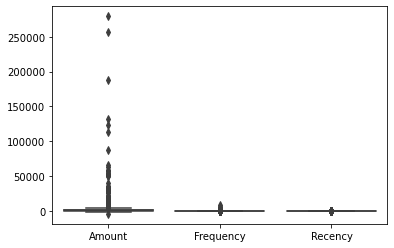

In [66]:
import seaborn as sns
ax = sns.boxplot(data = df_final[attributes])

In [67]:
df_final.nunique().sum()

5143

In [69]:
df_final.shape

(4372, 3)

## Removing the Outliers

A quantile defines a particular part of a data set, i.e. a quantile determines how many values in a distribution are above or below a certain limit. Special quantiles are the quartile (quarter), the quintile (fifth) and percentiles (hundredth).


In [70]:
Q1 = df_final.Amount.quantile(0.05)
Q3 = df_final.Amount.quantile(0.95)
IQR = Q3 - Q1
df_final = df_final[(df_final.Amount >= Q1 - 1.5 * IQR) & (df_final.Amount <= Q3 + 1.5 * IQR) ]

Q1 = df_final.Recency.quantile(0.05)
Q3 = df_final.Recency.quantile(0.95)
IQR = Q3 - Q1
df_final = df_final[(df_final.Recency >= Q1 - 1.5 * IQR) & (df_final.Recency <= Q3 + 1.5 * IQR) ]

Q1 = df_final.Frequency.quantile(0.05)
Q3 = df_final.Frequency.quantile(0.95)
IQR = Q3 - Q1
df_final = df_final[(df_final.Frequency >= Q1 - 1.5 * IQR) & (df_final.Frequency <= Q3 + 1.5 * IQR) ]

In [71]:
df_final.shape

(4293, 3)

In [72]:
df_final.head()

,Amount,Frequency,Recency
CustomerID,,,
12346.0,0.00,2,325
12347.0,4310.00,182,1
12348.0,1797.24,31,74
12349.0,1757.55,73,18
12350.0,334.40,17,309


### Scaling the data to get each column on similar scale

In [73]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
#transform the data
df1 = scaler.fit_transform(df_final)

In [74]:
df1.shape


(4293, 3)

In [77]:
import pandas as pd
df_f = pd.DataFrame(df1)
df_f.columns = ['Amount' , 'Frequency' , 'Recency']
df_f.head()

,Amount,Frequency,Recency
0,-0.723738,-0.752888,2.301611
1,1.731617,1.042467,-0.906466
2,0.300128,-0.463636,-0.183658
3,0.277517,-0.044720,-0.738141
4,-0.533235,-0.603275,2.143188


In [76]:
df_f

,Amount,Frequency,Recency
0,-0.723738,-0.752888,2.301611
1,1.731617,1.042467,-0.906466
2,0.300128,-0.463636,-0.183658
3,0.277517,-0.044720,-0.738141
4,-0.533235,-0.603275,2.143188
...,...,...,...
4288,-0.624669,-0.683068,-0.193560
4289,-0.620853,-0.673094,1.826341
4290,-0.677696,-0.703017,0.865898
4291,-0.623131,-0.643171,-0.847057


# Performing K-Means Clustering  

In [79]:
from sklearn.cluster import KMeans
# defining the kmeans function with initialization as k-means++
kmeans = KMeans(n_clusters = 2, init = 'k-means++' )
# fitting the k means algorithm on scaled data
kmeans.fit(df_f)

KMeans(n_clusters=2)

In [81]:
# inertia on the fitted data
kmeans.inertia_

7661.737552690924

## Checking the ideal number of clusters using the Elbow Method


Text(0, 0.5, 'Inertia')

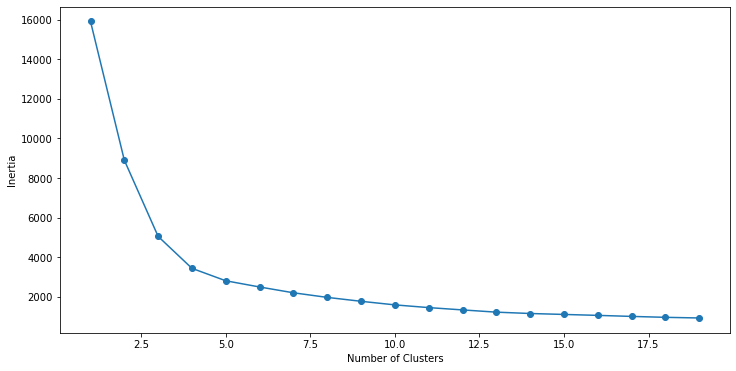

In [97]:
# fitting multiple k-means algorithms and storing the values in an empty list
SSE=[]
for clusters in range(1,20):
    kmeans=KMeans(n_clusters=clusters, init='k-means++')
    kmeans.fit(df_f)
    SSE.append(kmeans.inertia_)
    
# converting the results into a dataframe and plotting them
frame = pd.DataFrame({'Cluster':range(1,20), 'SSE': SSE})
plt.figure(figsize = (12,6))
plt.plot(frame['Cluster'],frame['SSE'], marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')

In [117]:
# k means using 5 clusters and k-means++ initialization
kmeans = KMeans(n_jobs=-1,n_clusters=5,init='k-means++')
kmeans.fit(df_f)
pred=kmeans.predict(df_f)

C:\Users\soumy\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:938: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


In [118]:
frame = pd.DataFrame(df_f)
frame['cluster'] = pred
frame['cluster'].value_counts()

2    2142
1    1025
0     845
4     187
3      94
Name: cluster, dtype: int64

In [119]:
import matplotlib.pyplot as plt

In [120]:
pred

array([1, 0, 2, ..., 1, 2, 2])

## Plotting the various clusters taking 2 features at a time

C:\Users\soumy\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Amount', ylabel='Frequency'>

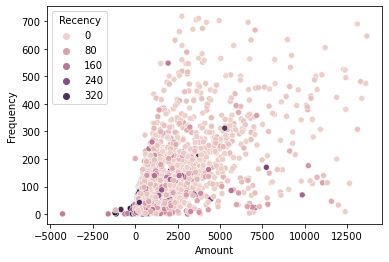

In [121]:
sns.scatterplot(df_final['Amount'] ,df_final['Frequency'] ,df_final['Recency'] , hue = df_final['Label'])

C:\Users\soumy\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Frequency', ylabel='Recency'>

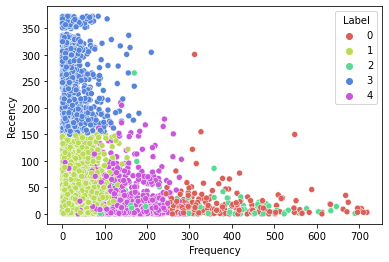

In [122]:
sns.scatterplot(df_final['Frequency'] ,df_final['Recency'] , hue = df_final['Label'] , palette = sns.color_palette('hls',5))

##### 

C:\Users\soumy\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Amount', ylabel='Recency'>

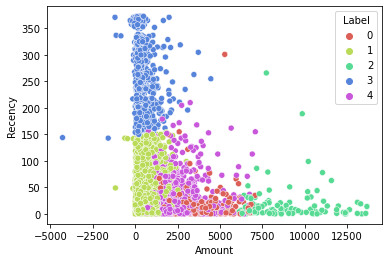

In [123]:
sns.scatterplot(df_final['Amount'] ,df_final['Recency'] , hue = df_final['Label'] , palette = sns.color_palette('hls',5))

C:\Users\soumy\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Amount', ylabel='Frequency'>

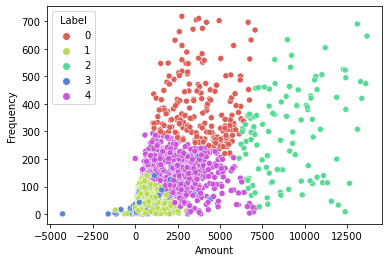

In [125]:
sns.scatterplot(df_final['Amount'] ,df_final['Frequency'] , hue = df_final['Label'] , palette = sns.color_palette('hls',5))